In [1]:
import os
import sys
import json
import numpy as np
import time
from PIL import Image, ImageDraw

In [2]:
# Set the ROOT_DIR variable to the root directory of the Mask_RCNN git repo
ROOT_DIR = '.'
assert os.path.exists(ROOT_DIR), 'ROOT_DIR does not exist. Did you forget to read the instructions above? ;)'

# Import mrcnn libraries
sys.path.append(ROOT_DIR) 
from mrcnn.config import Config
import mrcnn.utils as utils
from mrcnn import visualize
import mrcnn.model as modellib

In [3]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

In [4]:
# class CigButtsConfig(Config):
#     """Configuration for training on the cigarette butts dataset.
#     Derives from the base Config class and overrides values specific
#     to the cigarette butts dataset.
#     """
#     # Give the configuration a recognizable name
#     NAME = "cig_butts"

#     # Train on 1 GPU and 1 image per GPU. Batch size is 1 (GPUs * images/GPU).
#     GPU_COUNT = 1
#     IMAGES_PER_GPU = 1

#     # Number of classes (including background)
#     NUM_CLASSES = 1 + 1  # background + 1 (cig_butt)

#     # All of our training images are 512x512
#     IMAGE_MIN_DIM = 512
#     IMAGE_MAX_DIM = 512

#     # You can experiment with this number to see if it improves training
#     STEPS_PER_EPOCH = 500

#     # This is how often validation is run. If you are using too much hard drive space
#     # on saved models (in the MODEL_DIR), try making this value larger.
#     VALIDATION_STEPS = 5
    
#     # Matterport originally used resnet101, but I downsized to fit it on my graphics card
#     BACKBONE = 'resnet50'

#     # To be honest, I haven't taken the time to figure out what these do
#     RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)
#     TRAIN_ROIS_PER_IMAGE = 32
#     MAX_GT_INSTANCES = 50 
#     POST_NMS_ROIS_INFERENCE = 500 
#     POST_NMS_ROIS_TRAINING = 1000 
    
# config = CigButtsConfig()
# config.display()

In [5]:
# class CocoLikeDataset(utils.Dataset):
#     """ Generates a COCO-like dataset, i.e. an image dataset annotated in the style of the COCO dataset.
#         See http://cocodataset.org/#home for more information.
#     """
#     def load_data(self, annotation_json, images_dir):
#         """ Load the coco-like dataset from json
#         Args:
#             annotation_json: The path to the coco annotations json file
#             images_dir: The directory holding the images referred to by the json file
#         """
#         # Load json from file
#         json_file = open(annotation_json)
#         coco_json = json.load(json_file)
#         json_file.close()
        
#         # Add the class names using the base method from utils.Dataset
#         source_name = "coco_like"
#         for category in coco_json['categories']:
#             class_id = category['id']
#             class_name = category['name']
#             if class_id < 1:
#                 print('Error: Class id for "{}" cannot be less than one. (0 is reserved for the background)'.format(class_name))
#                 return
            
#             self.add_class(source_name, class_id, class_name)
        
#         # Get all annotations
#         annotations = {}
#         for annotation in coco_json['annotations']:
#             image_id = annotation['image_id']
#             if image_id not in annotations:
#                 annotations[image_id] = []
#             annotations[image_id].append(annotation)
        
#         # Get all images and add them to the dataset
#         seen_images = {}
#         for image in coco_json['images']:
#             image_id = image['id']
#             if image_id in seen_images:
#                 print("Warning: Skipping duplicate image id: {}".format(image))
#             else:
#                 seen_images[image_id] = image
#                 try:
#                     image_file_name = image['file_name']
#                     image_width = image['width']
#                     image_height = image['height']
#                 except KeyError as key:
#                     print("Warning: Skipping image (id: {}) with missing key: {}".format(image_id, key))
                
#                 image_path = os.path.abspath(os.path.join(images_dir, image_file_name))
#                 image_annotations = annotations[image_id]
                
#                 # Add the image using the base method from utils.Dataset
#                 self.add_image(
#                     source=source_name,
#                     image_id=image_id,
#                     path=image_path,
#                     width=image_width,
#                     height=image_height,
#                     annotations=image_annotations
#                 )
                
#     def load_mask(self, image_id):
#         """ Load instance masks for the given image.
#         MaskRCNN expects masks in the form of a bitmap [height, width, instances].
#         Args:
#             image_id: The id of the image to load masks for
#         Returns:
#             masks: A bool array of shape [height, width, instance count] with
#                 one mask per instance.
#             class_ids: a 1D array of class IDs of the instance masks.
#         """
#         image_info = self.image_info[image_id]
#         annotations = image_info['annotations']
#         instance_masks = []
#         class_ids = []
        
#         for annotation in annotations:
#             class_id = annotation['category_id']
#             mask = Image.new('1', (image_info['width'], image_info['height']))
#             mask_draw = ImageDraw.ImageDraw(mask, '1')
#             for segmentation in annotation['segmentation']:
#                 mask_draw.polygon(segmentation, fill=1)
#                 bool_array = np.array(mask) > 0
#                 instance_masks.append(bool_array)
#                 class_ids.append(class_id)

#         mask = np.dstack(instance_masks)
#         class_ids = np.array(class_ids, dtype=np.int32)
        
#         return mask, class_ids

In [6]:
# dataset_train = CocoLikeDataset()
# dataset_train.load_data('./datasets/cig_butts/train/coco_annotations.json', './datasets/cig_butts/train/images')
# dataset_train.prepare()

# dataset_val = CocoLikeDataset()
# dataset_val.load_data('./datasets/droneDetection/val/_label.json', './datasets/droneDetection/val/images')
# dataset_val.prepare()

class_names = ['BG', 'target']

In [7]:
class InferenceConfig(Config):
    
    # Give the configuration a recognizable name
    NAME = "drones_detection"

    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    DETECTION_MIN_CONFIDENCE = 0.9
    
     # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 1 (cig_butt)

    # You can experiment with this number to see if it improves training
    STEPS_PER_EPOCH = 500

    # This is how often validation is run. If you are using too much hard drive space
    # on saved models (in the MODEL_DIR), try making this value larger.
    VALIDATION_STEPS = 5
    
    # Matterport originally used resnet101, but I downsized to fit it on my graphics card
    BACKBONE = 'resnet50'

    # To be honest, I haven't taken the time to figure out what these do
    RPN_ANCHOR_SCALES = (8, 16, 32, 64, 128)
    TRAIN_ROIS_PER_IMAGE = 32
    MAX_GT_INSTANCES = 50 
    POST_NMS_ROIS_INFERENCE = 500 
    POST_NMS_ROIS_TRAINING = 1000 

inference_config = InferenceConfig()
inference_config.display()


Configurations:
BACKBONE                       resnet50
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE              

In [8]:
# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

Instructions for updating:
The `validate_indices` argument has no effect. Indices are always validated on CPU and never validated on GPU.
Instructions for updating:
Use fn_output_signature instead


In [9]:
# Get path to saved weights
# Either set a specific path or find last trained weights
# model_path = os.path.join(ROOT_DIR, ".h5 file name here")
# model_path = model.find_last()
model_path = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
# model.load_weights(model_path, by_name=True, exclude=["mrcnn_class_logits","mrcnn_bbox_fc", "mrcnn_mask"])
model.load_weights(model_path, by_name=True)

Loading weights from  ./mask_rcnn_coco.h5


Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  139.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


/home/dylan/anaconda3/envs/my_env/lib/python3.9/site-packages/tensorflow/python/keras/engine/training.py:2426: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


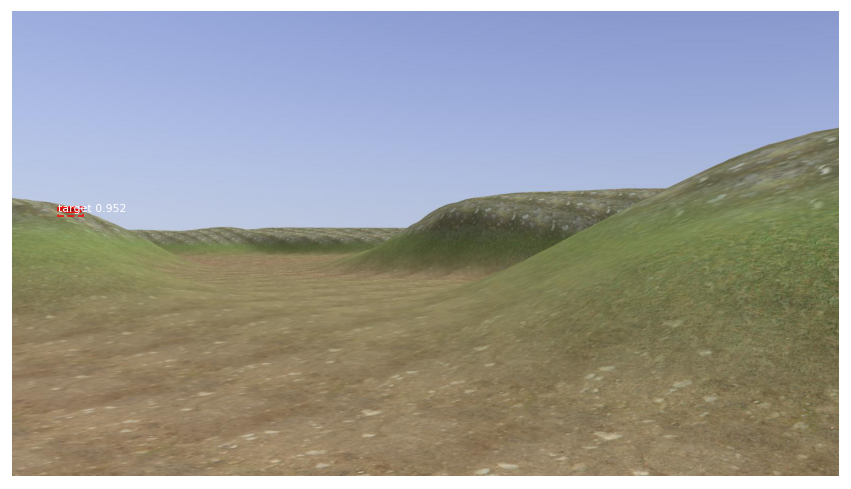

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  246.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


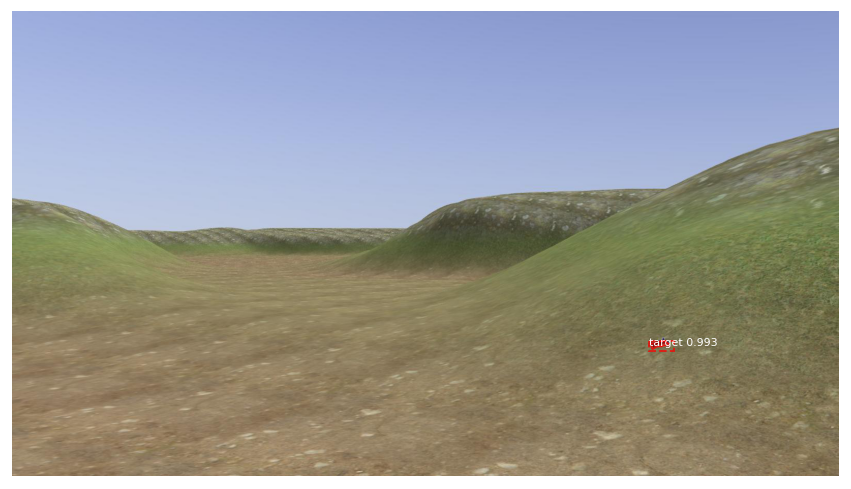

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  145.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


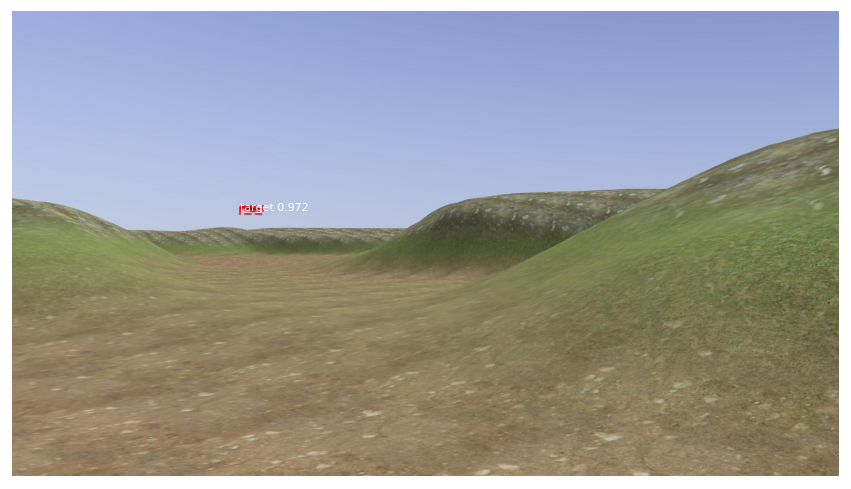

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  248.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


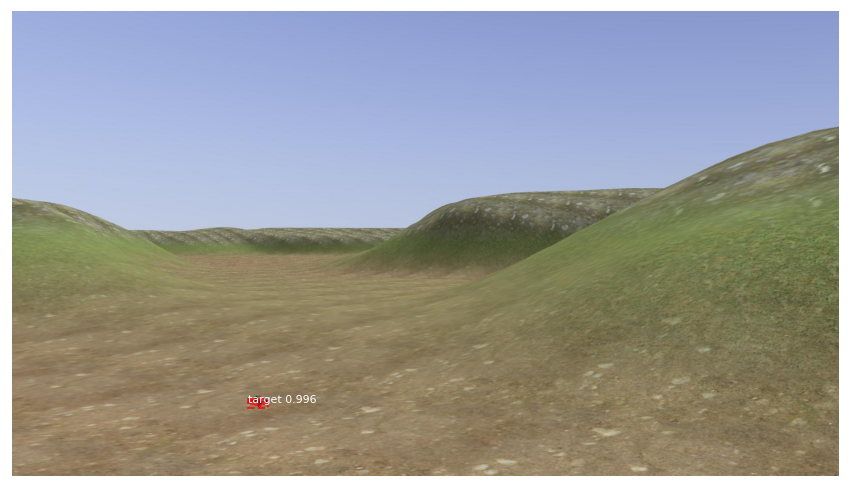

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  245.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  136.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


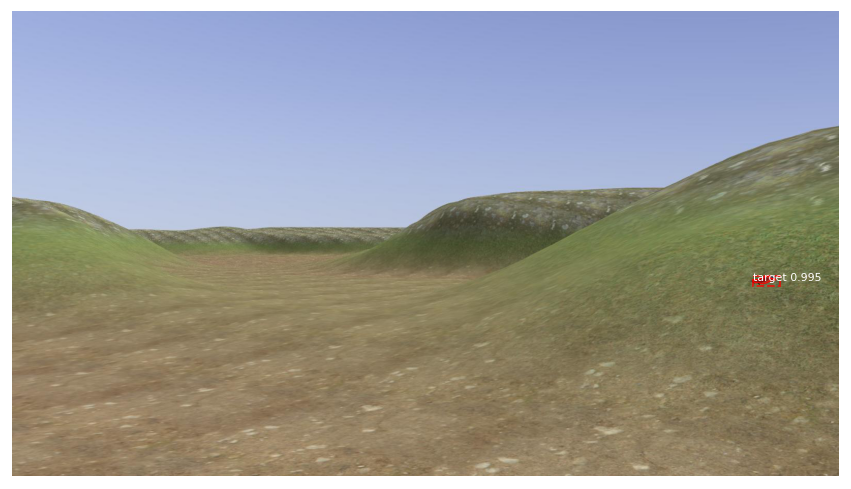

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  247.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  138.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


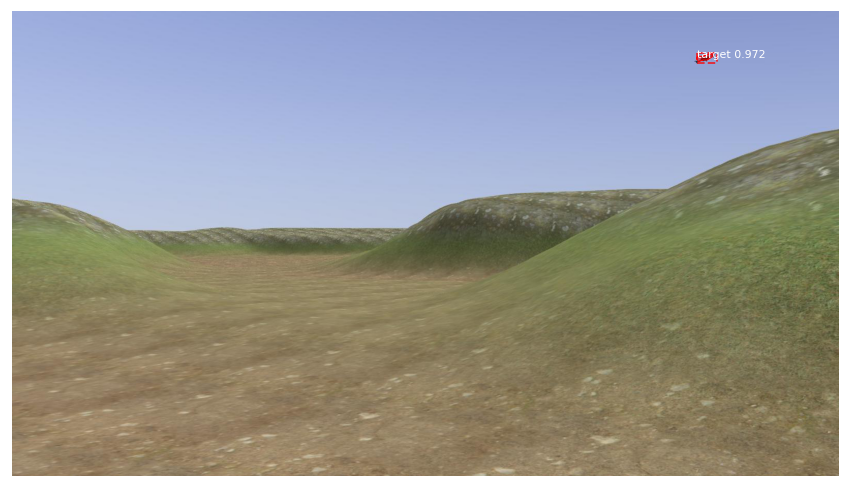

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


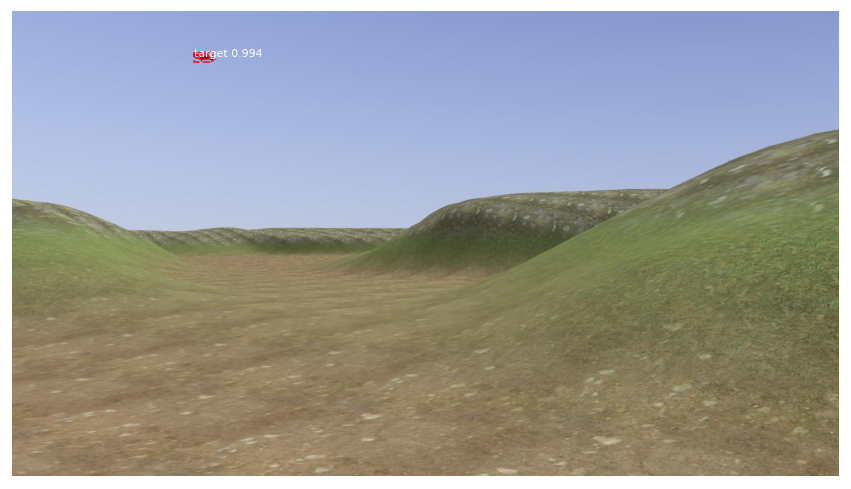

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  249.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  138.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


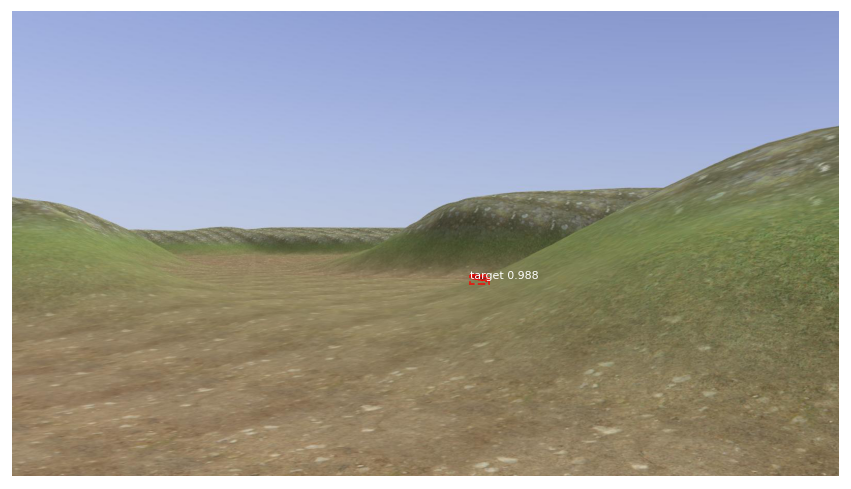

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  140.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


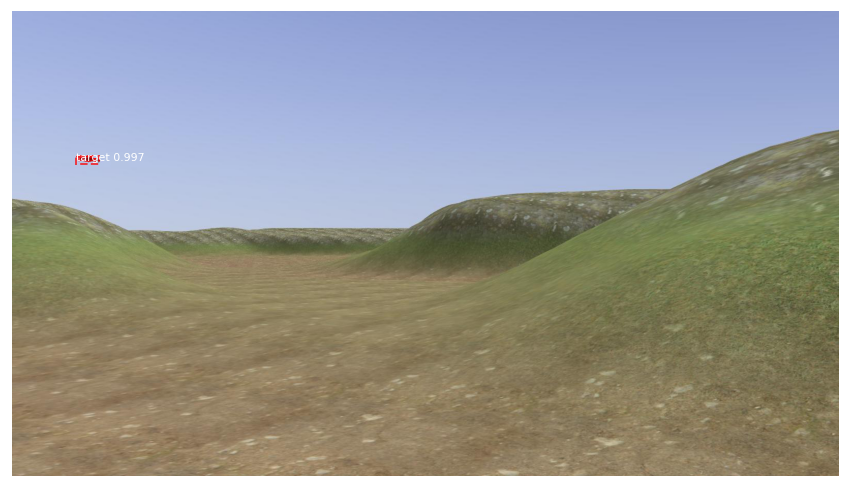

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  245.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


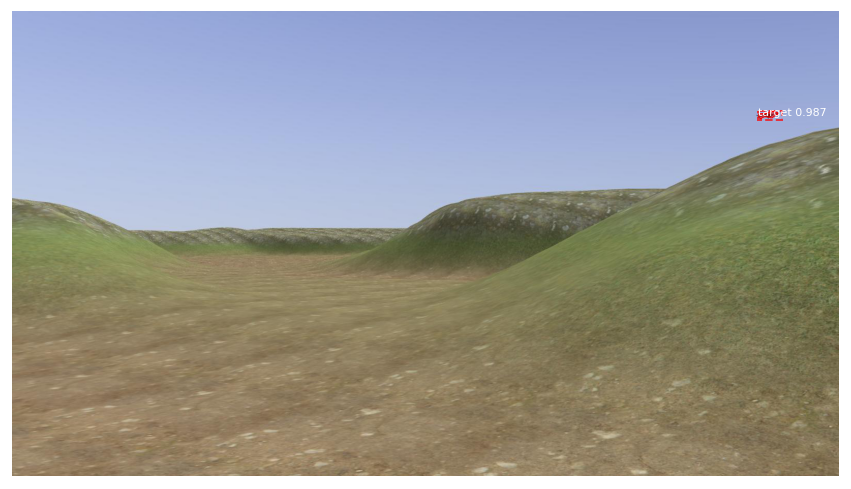

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  250.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  134.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


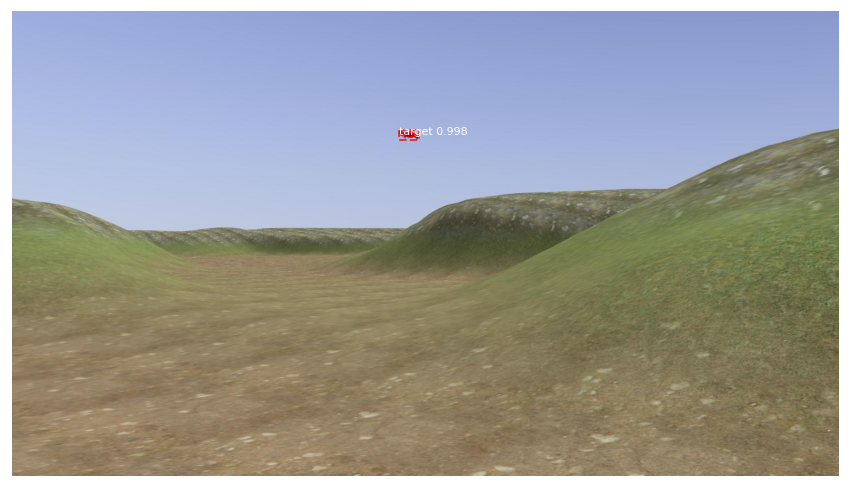

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  248.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  142.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


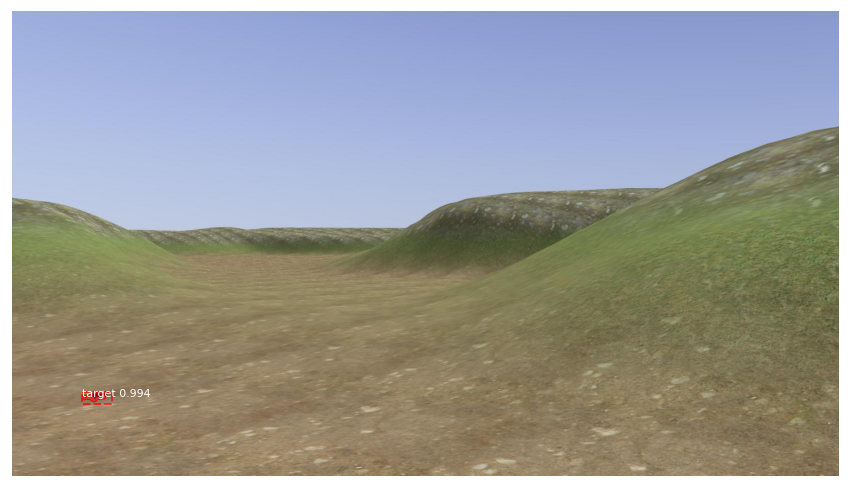

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  136.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


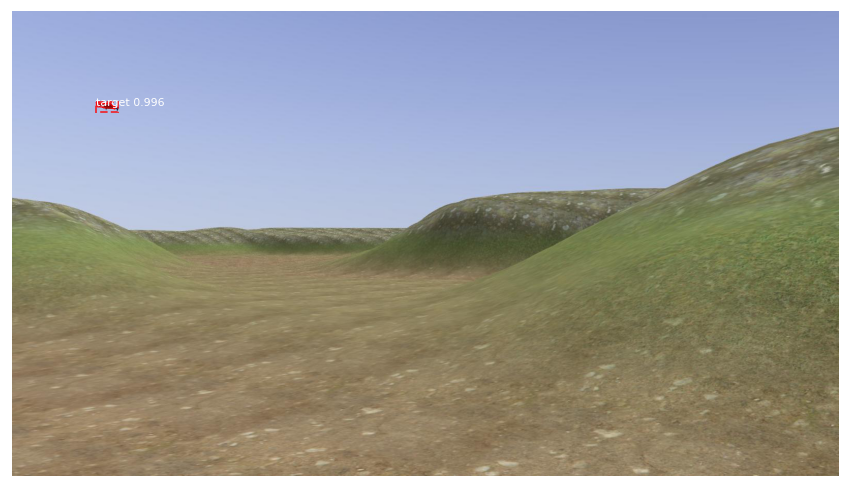

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  251.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  133.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


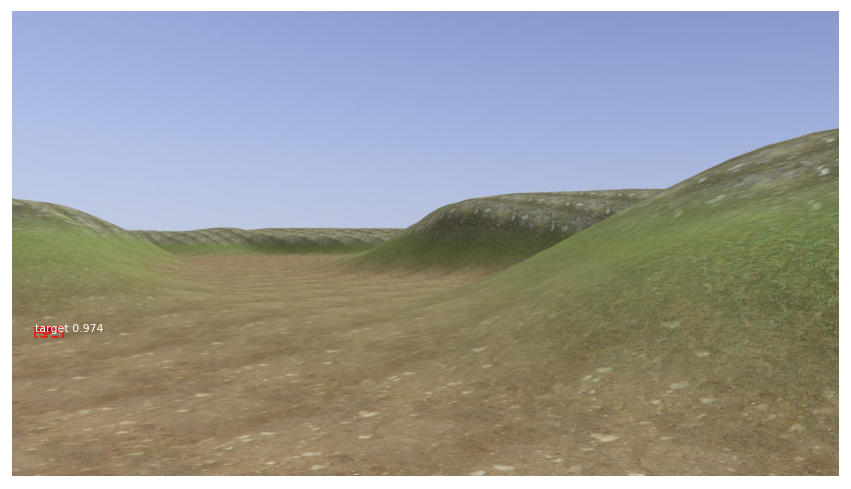

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  141.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


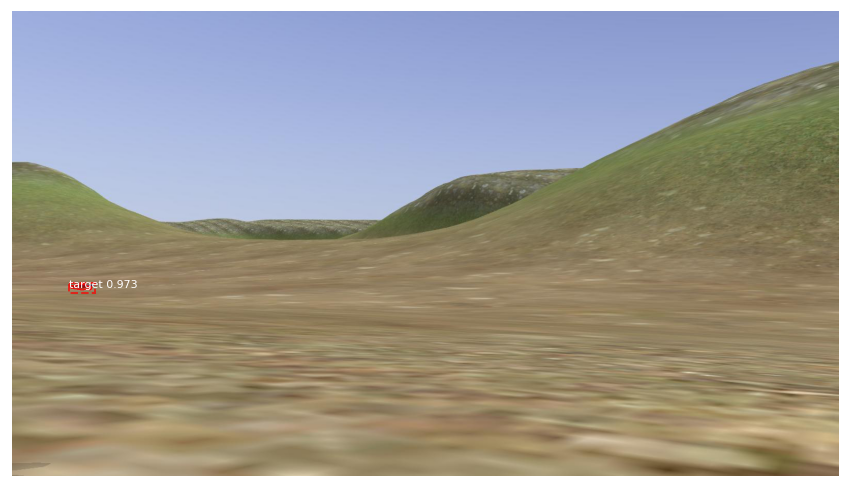

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  251.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  138.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


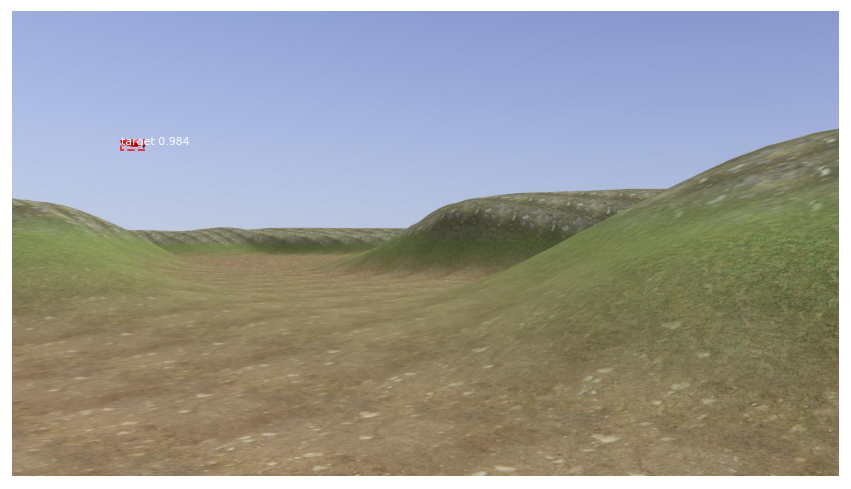

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  134.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


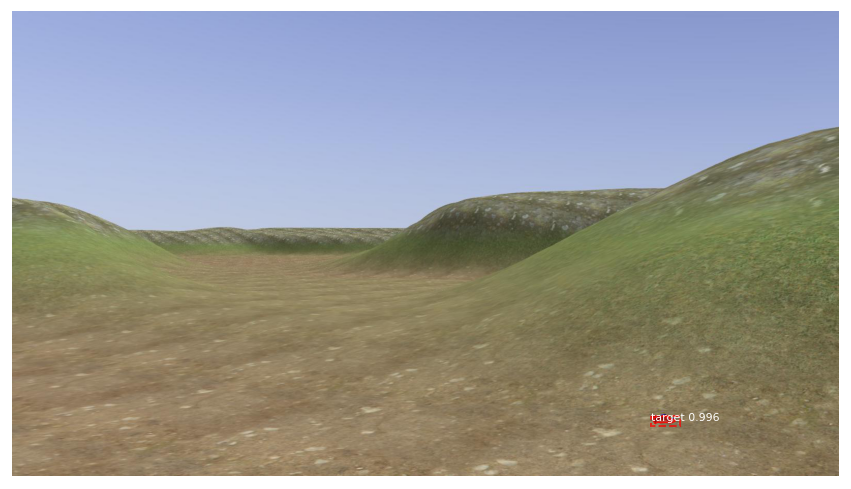

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  247.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  138.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


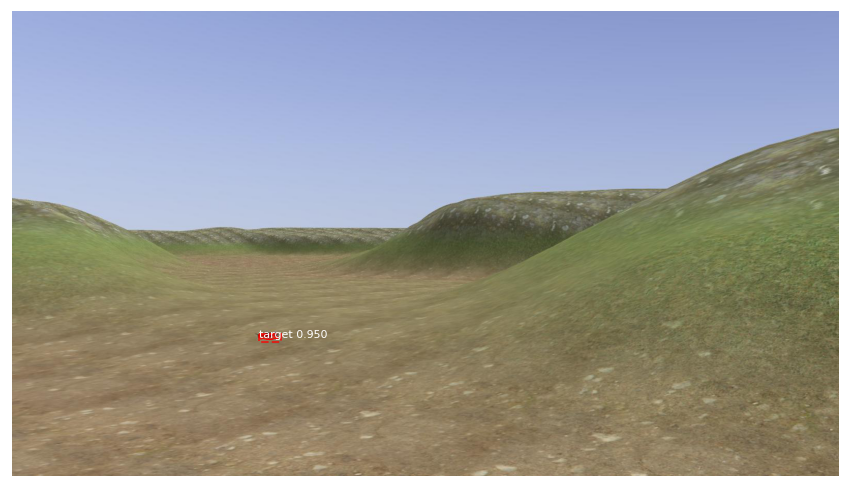

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  249.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  140.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


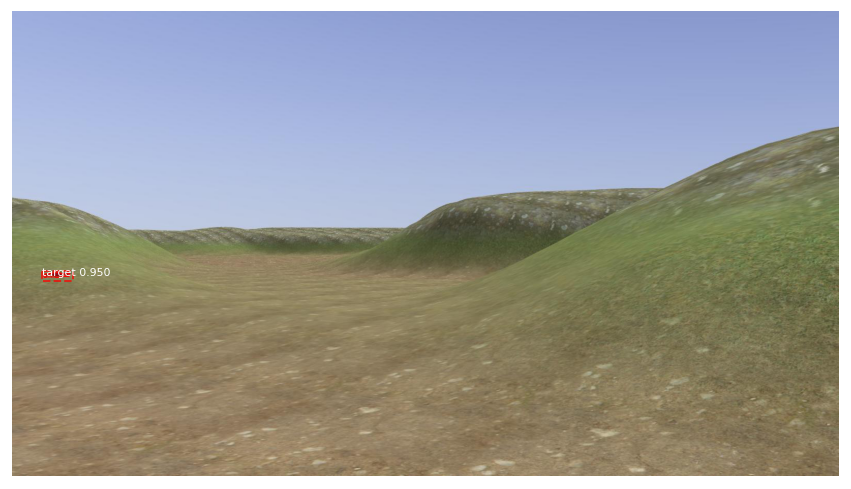

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  246.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  136.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


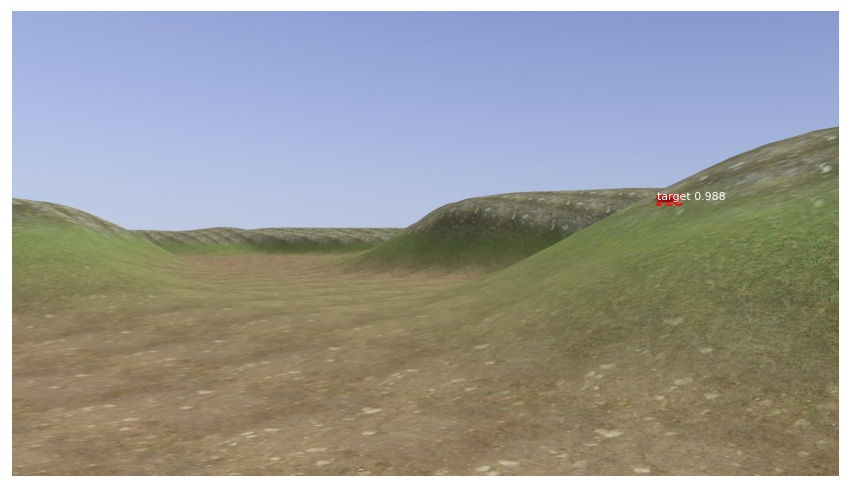

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  249.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


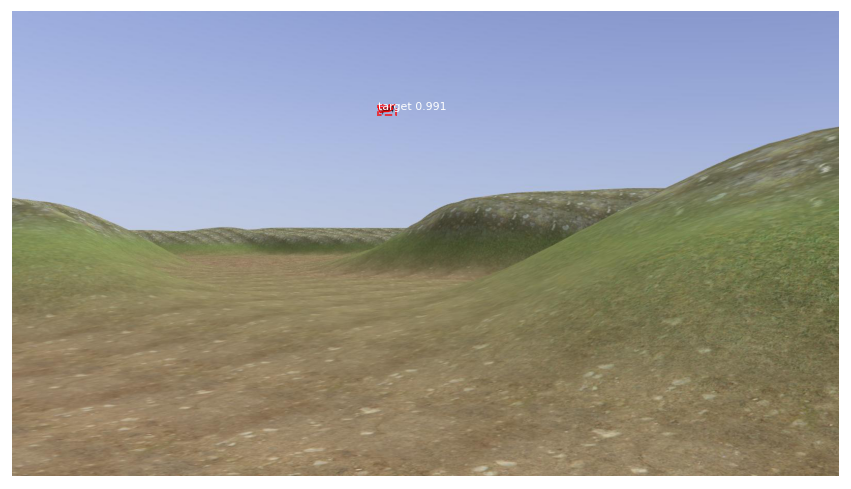

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  246.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32

*** No instances to display *** 



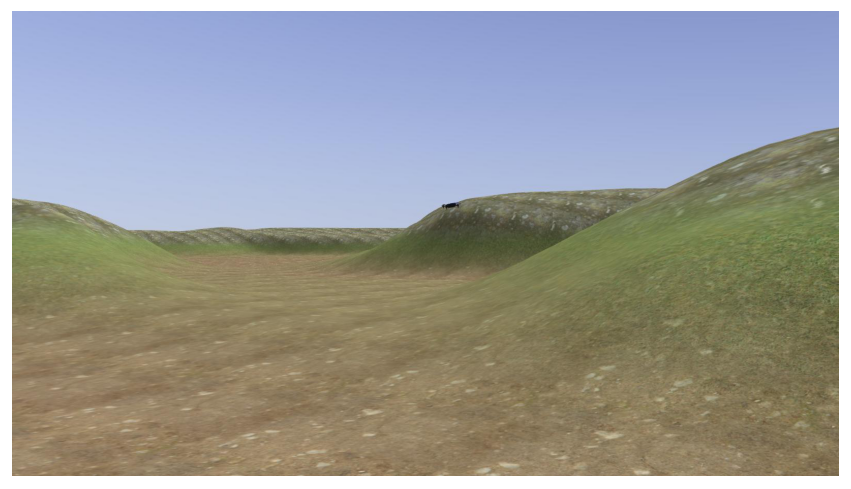

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  246.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  133.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32

*** No instances to display *** 



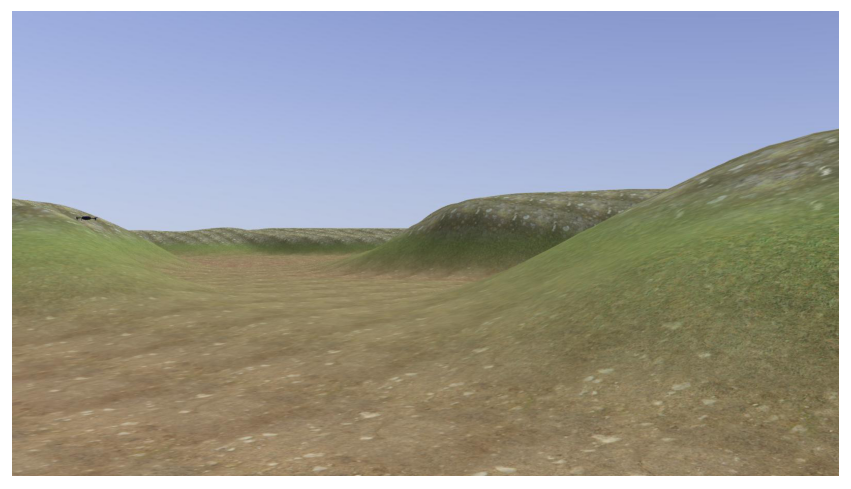

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  245.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  137.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


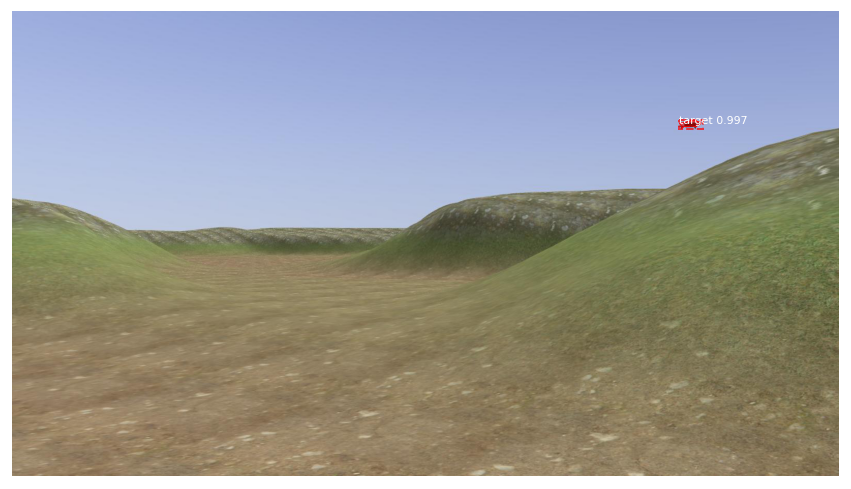

Processing 1 images
image                    shape: (900, 1600, 3)        min:    0.00000  max:  248.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  135.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1600.00000  float64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


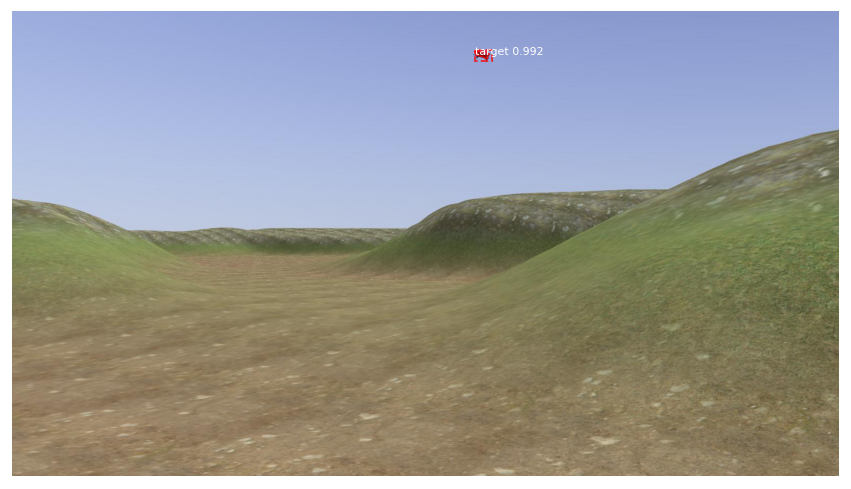

In [10]:
import skimage
import matplotlib.pyplot as plt

image_name = "image_20m"
results_name = "results" + image_name[5:]

real_test_dir = './datasets/droneDetection/real_test/' + image_name + '/'
image_paths = []
for filename in os.listdir(real_test_dir):
    if os.path.splitext(filename)[1].lower() in ['.png', '.jpg', '.jpeg']:
        image_paths.append(os.path.join(real_test_dir, filename))

bbox_values = []
count = 1
results_path = "./datasets/droneDetection/real_test/" + results_name + "/"
for image_path in image_paths:
    img = skimage.io.imread(image_path)
    img_arr = np.array(img)
    results = model.detect([img_arr], verbose=1)
    r = results[0]
    bbox_values.append(r['rois'])
#     print(count)
    visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], 
                                class_names, r['scores'], figsize=(15,15))
#     plt.savefig(results_path + results_name +"_"+str(count)+".jpg")
    plt.show()
    count+=1

In [11]:
bbox_values

[array([[378,  88, 395, 137]], dtype=int32),
 array([[ 637, 1233,  656, 1281]], dtype=int32),
 array([[376, 440, 392, 485]], dtype=int32),
 array([[749, 457, 768, 495]], dtype=int32),
 array([[ 511, 1433,  531, 1486]], dtype=int32),
 array([[  81, 1325,  100, 1363]], dtype=int32),
 array([[ 79, 351,  98, 388]], dtype=int32),
 array([[509, 886, 527, 923]], dtype=int32),
 array([[279, 124, 295, 167]], dtype=int32),
 array([[ 192, 1444,  210, 1489]], dtype=int32),
 array([[230, 748, 249, 787]], dtype=int32),
 array([[736, 134, 760, 192]], dtype=int32),
 array([[174, 161, 194, 204]], dtype=int32),
 array([[610,  43, 629,  98]], dtype=int32),
 array([[526, 109, 544, 159]], dtype=int32),
 array([[249, 211, 267, 254]], dtype=int32),
 array([[ 783, 1236,  802, 1293]], dtype=int32),
 array([[623, 477, 640, 519]], dtype=int32),
 array([[502,  57, 521, 118]], dtype=int32),
 array([[ 355, 1248,  374, 1295]], dtype=int32),
 array([[181, 707, 200, 743]], dtype=int32),
 array([], shape=(0, 4), dtype=